# **TCGA Hyperparameter search**



# **Imports**

In [18]:
# import the VAE code
import sys
from buddi import buddi
from buddi.preprocessing import sc_preprocess
from buddi.plotting import validation_plotting as vp


# general imports

import warnings
import numpy as np
import scanpy as sc
import scipy
import anndata as ad


# Images, plots, display, and visualization
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.preprocessing import scale, MinMaxScaler
from matplotlib_venn import venn2
from upsetplot import from_contents, UpSet

# programming stuff
import time
import os
import pickle
from pathlib import Path

# tensorflow stuff
import tensorflow as tf
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras.utils import to_categorical, normalize, plot_model
from sklearn.model_selection import train_test_split


# disable eager execution
# https://github.com/tensorflow/tensorflow/issues/47311#issuecomment-786116401
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()


In [19]:
## parameters
sc_aug_data_path = f"{os.getcwd()}/../data/pseudobulks/"
res_data_path = f"{os.getcwd()}/../results/buddiM2_tcga/"

cfdna_file = f"{os.getcwd()}/../data/cfDNA/cfdna_processed.h5ad"

regions_path = f"{os.getcwd()}/../data/reference/TCGA_regions.csv"


num_genes = 7000

exp_id = "all-tcga"
res_id = "all-tcga"

RETRAIN_MODELS = False


# Set-up experimental variables

In [20]:

##################################################
#####. set up experiment specific variables
##################################################

# number expected cell types
n_cell_types = 8

# number of patients/domains/samples expected
n_tot_samples = 525 # all TCGA samples

# number of drugs 
# one-hot encoded
n_drugs = 8

# number of types of sequencing (one-hot encoded)
n_tech = 5


# **Load / Pre-process data**
Import pre-processed pseudobulks

In [21]:


# now get the training data

# read in order
# oritinal samples
sample_order = [5001, 5000, 1000, 500, 100, 19000, 99000, 99900]

X_concat = None
Y_concat = None
meta_concat = None
for curr_samp in sample_order:

    print(curr_samp)
    pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_pseudobulk_file(sc_aug_data_path, curr_samp, "STIM", "Train", exp_id)
    pseudobulks_df.columns = gene_df

    if X_concat is None:
        X_concat, Y_concat, meta_concat = pseudobulks_df, prop_df, metadata_df
    else:
        X_concat = pd.concat([X_concat, pseudobulks_df])
        Y_concat = pd.concat([Y_concat, prop_df])
        meta_concat = pd.concat([meta_concat, metadata_df])

X_train = X_concat
Y_train = Y_concat
meta_train = meta_concat
meta_train.cancer_type = meta_train.cancer_type.astype('str')
meta_train.cancer_type.iloc[np.where(meta_train.num_blood == 5001)] = "blood"
meta_train["samp_type"] = meta_train["num_blood"] ## sc is the train (known prop == known cancer type)

# split samples into train test heldout
meta_train_train, meta_train_test, Y_train_train, Y_train_test, X_train_train, X_train_test = train_test_split(meta_train, Y_train, X_train, test_size=0.2, stratify=meta_train[['cancer_type', 'num_blood']])
meta_train_test.isTraining = "Test"
meta_train = pd.concat([meta_train_train, meta_train_test])
X_train = pd.concat([X_train_train, X_train_test])
Y_train = pd.concat([Y_train_train, Y_train_test])


cancer_train = pd.get_dummies(meta_train.cancer_type)


X_concat = None
Y_concat = None
meta_concat = None
for curr_samp in sample_order:

    print(curr_samp)
    pseudobulks_df, prop_df, gene_df, sig_df, metadata_df = sc_preprocess.read_single_pseudobulk_file(sc_aug_data_path, curr_samp, "STIM", "Test", exp_id)
    pseudobulks_df.columns = gene_df

    if X_concat is None:
        X_concat, Y_concat, meta_concat = pseudobulks_df, prop_df, metadata_df
    else:
        X_concat = pd.concat([X_concat, pseudobulks_df])
        Y_concat = pd.concat([Y_concat, prop_df])
        meta_concat = pd.concat([meta_concat, metadata_df])

X_test = X_concat
Y_test = Y_concat
meta_test = meta_concat
meta_test.cancer_type = meta_test.cancer_type.astype('str')
meta_test.cancer_type.iloc[np.where(meta_test.num_blood == 5001)] = "blood"
meta_test["samp_type"] = meta_test["num_blood"]
meta_test.isTraining = "heldout"

cancer_test = pd.get_dummies(meta_test.cancer_type)


X_full = pd.concat([X_train, X_test])
Y_full = pd.concat([Y_train, Y_test])
meta_df = pd.concat([meta_train, meta_test])
cancer_df = pd.concat([cancer_train, cancer_test])





5001
5000
1000
500
100
19000
99000
99900


/tmp/ipykernel_1857477/1600835144.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  meta_train.cancer_type.iloc[np.where(meta_train.num_blood == 5001)] = "blood"


5001
5000
1000
500
100
19000
99000
99900


/tmp/ipykernel_1857477/1600835144.py:61: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  meta_test.cancer_type.iloc[np.where(meta_test.num_blood == 5001)] = "blood"


In [22]:
cancer_df

,BRCA,COAD,KIDNEY,LIHC,LUNG,PRAD,STAD,blood
COAD_8E38B9F2_90FA_4DA8_A332_7F8B75AD6C4A_X023_S08_L088_B1_T2_P058,0,1,0,0,0,0,0,0
KIRP_8CAE0E7A_6D06_46BF_BC85_57E457CFBBDA_X008_S11_L021_B1_T1_P018,0,0,1,0,0,0,0,0
LUAD_ECBD63B4_2B0B_4E3C_A25D_A3580CEAF276_X040_S01_L122_B1_T2_P102,0,0,0,0,1,0,0,0
BRCA_BE0F871D_DFA0_4B91_A068_41A57C105E1B_X007_S05_L064_B1_T1_P013,1,0,0,0,0,0,0,0
STAD_2A8C4C35_D8EA_4423_9ECA_D0612BC1C647_X036_S11_L045_B1_T1_P092,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...
STAD_BAB7D0D7_4F14_4ED4_B8E4_B9E760F57246_X041_S02_L003_B1_T1_P084,0,0,0,0,0,0,1,0
STAD_D1C43A87_4C70_4AE9_9023_880A46E79F21_X037_S09_L065_B1_T1_PMRG,0,0,0,0,0,0,1,0
STAD_D1C43A87_4C70_4AE9_9023_880A46E79F21_X037_S09_L066_B1_T2_P088,0,0,0,0,0,0,1,0
STAD_E07AAE91_7A4F_4FDC_9D67_4FA1D4E6DD89_X024_S05_L012_B1_T2_P069,0,0,0,0,0,0,1,0


In [23]:
X_train

gene_ids,chr1:17238-17739,chr1:817118-817619,chr1:826524-827025,chr1:827303-827804,chr1:830679-831180,chr1:877099-877600,chr1:920320-920821,chr1:925423-925924,chr1:929911-930412,chr1:938609-939110,...,chrX:155264243-155264744,chrX:155334487-155334988,chrX:155334996-155335497,chrX:155612717-155613218,chrX:155766937-155767438,chrX:155767443-155767944,chrX:155880523-155881024,chrX:155881036-155881537,chrX:156003787-156004288,chrX:156005167-156005668
0,29.656251,505.803553,103.718160,1902.353404,19.908709,72.005965,212.570228,649.558199,114.320359,229.539946,...,531.012147,157.893491,157.713712,707.458394,93.407274,199.241834,144.817952,1472.635661,44.971929,40.831387
0,166.119295,4103.534987,2024.532696,27349.603668,877.792851,1045.507748,2055.341770,11389.441319,1475.293889,2957.712724,...,12988.712566,969.306486,1428.694837,10080.643379,554.987745,1061.465069,2858.168656,20160.098068,583.305542,557.014724
0,101.606068,2157.114621,1746.399824,27003.071304,801.618342,1425.097723,1982.921171,11947.470200,1459.601235,2329.730924,...,12395.970531,1372.582501,1697.426318,8340.426265,523.266695,805.641278,2446.325353,19589.559406,513.482319,404.682358
0,50.830985,216.473341,103.899812,2159.908624,35.164165,51.890696,221.805958,637.332593,101.519304,214.512614,...,697.712377,155.861757,74.951038,514.612651,67.600681,185.227586,286.073821,1265.278143,80.389950,48.179680
0,51.239079,89.812466,122.052701,2035.706838,27.214403,59.433015,257.077416,560.710129,151.189818,282.090523,...,774.196301,57.137856,74.660789,511.043679,193.762601,298.541597,181.264366,1224.929854,72.921168,93.919378
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,35.129902,16.641372,29.334660,539.684037,16.167122,39.033226,31.393561,49.614253,45.562235,58.386825,...,158.384014,46.635667,54.442315,300.896712,46.839870,144.823746,110.450001,397.371499,28.135407,49.761362
0,25.118602,776.809634,432.867990,5922.076576,144.075399,157.201986,567.177945,2581.026525,405.577488,553.736860,...,2494.631890,256.816204,291.779450,2148.389584,88.536714,281.276481,546.771503,4030.632872,170.432005,171.409564
0,154.290269,3998.550868,3268.904797,33343.856117,1129.681225,875.118467,2012.241845,12572.181044,1871.435877,3525.327452,...,15283.631604,1408.057626,3798.527203,10062.068540,386.849983,978.434558,3152.831455,21893.586391,460.689047,272.604691
0,56.264959,222.784073,211.261805,1814.215954,76.429804,121.468379,211.763643,732.729446,119.319914,272.060608,...,690.491936,465.438528,163.312100,421.562349,45.068728,111.537015,198.431000,1493.084700,88.595623,106.290939


In [24]:
# double check all the pseudobulks/bulks were read in
meta_df.sample_id.value_counts()

COAD_8E38B9F2_90FA_4DA8_A332_7F8B75AD6C4A_X023_S08_L088_B1_T2_P058    8
STAD_0215A386_9440_452B_9832_B64A80AA8898_X030_S04_L031_B1_T1_P080    8
STAD_78ACDA82_EAB2_4188_9631_A23425981D92_X028_S05_L110_B1_T2_P061    8
BRCA_8762FC8D_91FC_42B8_B74D_141298970EFC_X001_S03_L006_B1_T2_P004    8
LIHC_1916FDF9_2E1A_4B05_B5C6_98D5DBEA8488_X036_S08_L039_B1_T1_P104    8
                                                                     ..
KIRC_B73B67F3_4074_4DBF_97F1_081A17147C54_X007_S07_L068_B1_T2_P031    8
BRCA_1D939DC3_EF0C_40BF_BC60_8C5D46345265_X021_S01_L024_B1_T1_P051    8
LUAD_18B8C125_D05C_4AC1_A739_FCC610777B0F_X037_S01_L049_B1_T1_P088    8
LIHC_855E9254_23F8_426E_9A20_D4A42A2662EA_X032_S07_L082_B1_T1_P070    8
STAD_EA9A5DB6_348F_41C4_ACCC_5717653ABD74_X032_S06_L080_B1_T1_P080    8
Name: sample_id, Length: 525, dtype: int64

In [25]:


# how many of each mouse
tab = meta_df.groupby(['cancer_type', 'samp_type']).size()
tab.unstack()

samp_type,100,500,1000,5000,5001,19000,99000,99900
cancer_type,,,,,,,,
BRCA,141.0,141.0,141.0,141.0,NaN,141.0,141.0,141.0
COAD,81.0,81.0,81.0,81.0,NaN,81.0,81.0,81.0
KIDNEY,100.0,100.0,100.0,100.0,NaN,100.0,100.0,100.0
LIHC,34.0,34.0,34.0,34.0,NaN,34.0,34.0,34.0
LUNG,76.0,76.0,76.0,76.0,NaN,76.0,76.0,76.0
PRAD,52.0,52.0,52.0,52.0,NaN,52.0,52.0,52.0
STAD,41.0,41.0,41.0,41.0,NaN,41.0,41.0,41.0
blood,NaN,NaN,NaN,NaN,525.0,NaN,NaN,NaN


In [26]:
# how many of each mouse
tab = meta_df.groupby(['samp_type', 'isTraining']).size()
tab.unstack()

isTraining,Test,Train,heldout
samp_type,,,
100,62,251,212
500,63,250,212
1000,63,250,212
5000,62,251,212
5001,63,250,212
19000,65,260,200
99000,65,260,200
99900,65,260,200


In [27]:


# how many of each mouse
tab = meta_df.groupby(['cancer_type', 'isTraining']).size()
tab.unstack()

isTraining,Test,Train,heldout
cancer_type,,,
BRCA,122,485,380
COAD,73,286,208
KIDNEY,84,332,284
LIHC,26,106,106
LUNG,63,262,207
PRAD,42,167,155
STAD,35,144,108
blood,63,250,212


In [28]:
meta_df

,sample_id,cancer_type,isTraining,num_blood,samp_type
COAD_8E38B9F2_90FA_4DA8_A332_7F8B75AD6C4A_X023_S08_L088_B1_T2_P058,COAD_8E38B9F2_90FA_4DA8_A332_7F8B75AD6C4A_X023...,COAD,Train,5000,5000
KIRP_8CAE0E7A_6D06_46BF_BC85_57E457CFBBDA_X008_S11_L021_B1_T1_P018,KIRP_8CAE0E7A_6D06_46BF_BC85_57E457CFBBDA_X008...,KIDNEY,Train,99000,99000
LUAD_ECBD63B4_2B0B_4E3C_A25D_A3580CEAF276_X040_S01_L122_B1_T2_P102,LUAD_ECBD63B4_2B0B_4E3C_A25D_A3580CEAF276_X040...,LUNG,Train,99900,99900
BRCA_BE0F871D_DFA0_4B91_A068_41A57C105E1B_X007_S05_L064_B1_T1_P013,BRCA_BE0F871D_DFA0_4B91_A068_41A57C105E1B_X007...,BRCA,Train,5000,5000
STAD_2A8C4C35_D8EA_4423_9ECA_D0612BC1C647_X036_S11_L045_B1_T1_P092,STAD_2A8C4C35_D8EA_4423_9ECA_D0612BC1C647_X036...,STAD,Train,5000,5000
...,...,...,...,...,...
STAD_BAB7D0D7_4F14_4ED4_B8E4_B9E760F57246_X041_S02_L003_B1_T1_P084,STAD_BAB7D0D7_4F14_4ED4_B8E4_B9E760F57246_X041...,STAD,heldout,99900,99900
STAD_D1C43A87_4C70_4AE9_9023_880A46E79F21_X037_S09_L065_B1_T1_PMRG,STAD_D1C43A87_4C70_4AE9_9023_880A46E79F21_X037...,STAD,heldout,99900,99900
STAD_D1C43A87_4C70_4AE9_9023_880A46E79F21_X037_S09_L066_B1_T2_P088,STAD_D1C43A87_4C70_4AE9_9023_880A46E79F21_X037...,STAD,heldout,99900,99900
STAD_E07AAE91_7A4F_4FDC_9D67_4FA1D4E6DD89_X024_S05_L012_B1_T2_P069,STAD_E07AAE91_7A4F_4FDC_9D67_4FA1D4E6DD89_X024...,STAD,heldout,99900,99900


In [29]:
Y_train

,CD4+ naïve T,CD4+ memory T,CD8+ naïve T,NK,CD14 mono,CD16 mono,intermediate mono,memory B,MAIT,CD8+ activated T,naïve B,pDC,mDC
0,0.002000,0.000800,0.300000,0.023000,0.000400,0.340600,0.079400,0.161200,0.001000,0.075400,0.006200,0.008800,0.001200
0,0.307434,0.239202,0.023758,0.027020,0.094869,0.008980,0.057040,0.055374,0.040000,0.022333,0.070909,0.020788,0.032293
0,0.026577,0.204364,0.111622,0.041792,0.002503,0.002482,0.059540,0.007147,0.002933,0.158008,0.316727,0.056807,0.009499
0,0.002400,0.161000,0.003200,0.000600,0.012400,0.024600,0.005200,0.333800,0.030600,0.376800,0.000600,0.008400,0.040400
0,0.019200,0.267200,0.000200,0.020600,0.001200,0.011800,0.002200,0.054600,0.003600,0.516400,0.002600,0.002200,0.098200
...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0.010000,0.260000,0.060000,0.020000,0.040000,0.400000,0.010000,0.090000,0.030000,0.010000,0.050000,0.010000,0.010000
0,0.040895,0.023579,0.373632,0.051368,0.018053,0.005737,0.068895,0.089789,0.190684,0.044579,0.041895,0.026263,0.024632
0,0.189119,0.004264,0.036356,0.001081,0.007928,0.008649,0.000470,0.095265,0.004254,0.418038,0.015365,0.008669,0.210541
0,0.150000,0.147200,0.028600,0.066800,0.028800,0.004200,0.011000,0.082600,0.266600,0.026400,0.156800,0.027200,0.003800


In [30]:
# check correlation of pseudobulks
bulk_check0 = 0
bulk_check1 = 100

print(np.corrcoef((X_train.iloc[bulk_check0] / np.sum(X_train.iloc[bulk_check0])), (X_train.iloc[bulk_check1] / np.sum(X_train.iloc[bulk_check1]))))
print(np.corrcoef((X_test.iloc[bulk_check0] / np.sum(X_test.iloc[bulk_check0])), (X_test.iloc[bulk_check1] / np.sum(X_test.iloc[bulk_check1]))))
print(np.corrcoef((X_train.iloc[bulk_check0] / np.sum(X_train.iloc[bulk_check0])), (X_test.iloc[bulk_check1] / np.sum(X_test.iloc[bulk_check1]))))


[[1.         0.97682482]
 [0.97682482 1.        ]]
[[1.         0.96972963]
 [0.96972963 1.        ]]
[[1.         0.96045775]
 [0.96045775 1.        ]]


# Define indices and set-up metadata

In [31]:

##################################################
#####. Design the experiment
##################################################


X_orig = np.copy(X_full)

# set up the metadata arrays and indices
samp_label = np.asarray(meta_df.sample_id)
index_label, numeric_label = np.unique(samp_label, return_inverse=True)
Label_full = numeric_label
label_full = to_categorical(numeric_label)

samp_bulk = np.asarray(meta_df.samp_type)
index_bulk, numeric_bulk = np.unique(samp_bulk, return_inverse=True)
Bulk_full = numeric_bulk
bulk_full = to_categorical(numeric_bulk)

samp_drug = np.asarray(meta_df.cancer_type)
index_drug, numeric_drug = np.unique(samp_drug, return_inverse=True)
Drug_full = numeric_drug
drug_full = to_categorical(numeric_drug)


idx_train = np.where(meta_df.isTraining=="Train")[0] 
idx_test = np.where(meta_df.isTraining=="Test")[0] 
idx_heldout = np.where(meta_df.isTraining=="heldout")[0] 

Y_max = np.copy(cancer_df)
Y_max = np.argmax(Y_max, axis=1)
Y_max = cancer_df.columns[Y_max]
meta_df["Y_max"] = Y_max

# now seperate out the training and testing data
X_train_df = X_full.iloc[idx_train]
Y_train_df = Y_full.iloc[idx_train]


# try using the regions genes
regions_df = pd.read_csv(regions_path, sep="," )
regions_genes = regions_df["seqnames"].astype(str) + ":" + regions_df["start"].astype(str) + "-" + regions_df["end"].astype(str)

# only keep regions genes that are in common genes
regions_genes = np.intersect1d(gene_df, regions_genes)

# convert to data matrices
X_train = X_train_df.to_numpy()
Y_train = Y_train_df.to_numpy()

## get the top variable genes
X_colmean = X_train.mean(axis=0)
X_colvar = X_train.var(axis=0)
X_CoV = np.array(np.divide(X_colvar, X_colmean+0.001))

# need to get the genes such that
# the union of the highly variable and the
# regionsx genes are 7000 total
num_genes_found = False
initial_count = 7000
while not num_genes_found:
    idx_top = np.argpartition(X_CoV, -initial_count)[-initial_count:]
    top_gene_df = gene_df.iloc[idx_top]
    CoV_only = np.union1d(top_gene_df, regions_genes)
    if len(CoV_only) == 7000:
        num_genes_found = True
    else:
        initial_count = initial_count -1

idx_top = np.argpartition(X_CoV, -initial_count)[-initial_count:] # num_genes to get 1550
gene_df = gene_df.iloc[idx_top]


In [32]:
regions_df.cancer.value_counts()

KIDNEY    583
LIHC      487
BRCA      485
PRAD      427
LUNG      270
COAD      239
STAD       30
Name: cancer, dtype: int64

In [33]:
X_CoV.shape

(45782,)

# compare our variable genes with cibersort defined genes

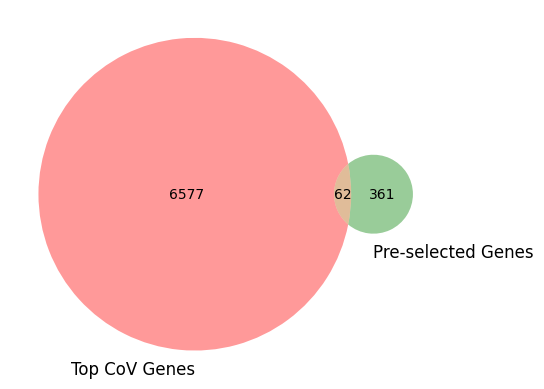

In [34]:

venn2([set(gene_df), set(regions_genes)], set_labels = ('Top CoV Genes', 'Pre-selected Genes'))
plt.show()

In [35]:
union_genes = np.union1d(gene_df, regions_genes)

len(union_genes)

7000

# Normalize data

In [36]:
X_full = X_full.loc[:,union_genes]

## normalize within sample
clip_upper = np.quantile(X_full, 0.9)
X_full = np.clip(X_full, 0, clip_upper)
scaler = MinMaxScaler()
scaler.fit(X_full)

# now normalize with the scaler trained on the 
# training data
X_full = np.clip(X_full, 0, clip_upper)
X_full = scaler.transform(X_full)


# for unknown proportions; 
# this is bulks used in training
X_unkp = X_full[idx_test,]
label_unkp = label_full[idx_test,]
bulk_unkp = bulk_full[idx_test,]
drug_unkp = drug_full[idx_test,]
y_unkp = Y_full.iloc[idx_test]
y_unkp = y_unkp.to_numpy()

# for known proportions
X_kp = X_full[idx_train,]
label_kp = label_full[idx_train,]
bulk_kp = bulk_full[idx_train,]
drug_kp = drug_full[idx_train,]
y_kp = Y_full.iloc[idx_train]
y_kp = y_kp.to_numpy()


In [37]:
y_kp

array([[0.002     , 0.0008    , 0.3       , ..., 0.0062    , 0.0088    ,
        0.0012    ],
       [0.30743434, 0.23920202, 0.02375758, ..., 0.07090909, 0.02078788,
        0.03229293],
       [0.02657658, 0.20436436, 0.11162162, ..., 0.31672673, 0.05680681,
        0.0094995 ],
       ...,
       [0.01718719, 0.25118118, 0.11196196, ..., 0.00224224, 0.05834835,
        0.06159159],
       [0.162     , 0.082     , 0.074     , ..., 0.008     , 0.012     ,
        0.18      ],
       [0.023     , 0.072     , 0.074     , ..., 0.311     , 0.014     ,
        0.169     ]])

In [38]:
y_unkp

array([[4.00000000e-04, 4.00000000e-04, 1.04000000e-02, ...,
        2.35800000e-01, 4.00000000e-04, 1.55000000e-01],
       [8.93939394e-03, 3.87333333e-01, 2.02020202e-05, ...,
        2.22424242e-02, 1.30303030e-02, 4.04040404e-05],
       [1.88947368e-02, 1.31157895e-01, 1.42105263e-03, ...,
        3.85263158e-02, 5.58421053e-02, 2.22105263e-02],
       ...,
       [1.89119119e-01, 4.26426426e-03, 3.63563564e-02, ...,
        1.53653654e-02, 8.66866867e-03, 2.10540541e-01],
       [1.50000000e-01, 1.47200000e-01, 2.86000000e-02, ...,
        1.56800000e-01, 2.72000000e-02, 3.80000000e-03],
       [3.01939612e-02, 2.98940212e-01, 5.53889222e-02, ...,
        1.35972805e-02, 2.47950410e-02, 1.26974605e-01]])

# Plot all data

In [39]:
meta_df

,sample_id,cancer_type,isTraining,num_blood,samp_type,Y_max
COAD_8E38B9F2_90FA_4DA8_A332_7F8B75AD6C4A_X023_S08_L088_B1_T2_P058,COAD_8E38B9F2_90FA_4DA8_A332_7F8B75AD6C4A_X023...,COAD,Train,5000,5000,COAD
KIRP_8CAE0E7A_6D06_46BF_BC85_57E457CFBBDA_X008_S11_L021_B1_T1_P018,KIRP_8CAE0E7A_6D06_46BF_BC85_57E457CFBBDA_X008...,KIDNEY,Train,99000,99000,KIDNEY
LUAD_ECBD63B4_2B0B_4E3C_A25D_A3580CEAF276_X040_S01_L122_B1_T2_P102,LUAD_ECBD63B4_2B0B_4E3C_A25D_A3580CEAF276_X040...,LUNG,Train,99900,99900,LUNG
BRCA_BE0F871D_DFA0_4B91_A068_41A57C105E1B_X007_S05_L064_B1_T1_P013,BRCA_BE0F871D_DFA0_4B91_A068_41A57C105E1B_X007...,BRCA,Train,5000,5000,BRCA
STAD_2A8C4C35_D8EA_4423_9ECA_D0612BC1C647_X036_S11_L045_B1_T1_P092,STAD_2A8C4C35_D8EA_4423_9ECA_D0612BC1C647_X036...,STAD,Train,5000,5000,STAD
...,...,...,...,...,...,...
STAD_BAB7D0D7_4F14_4ED4_B8E4_B9E760F57246_X041_S02_L003_B1_T1_P084,STAD_BAB7D0D7_4F14_4ED4_B8E4_B9E760F57246_X041...,STAD,heldout,99900,99900,STAD
STAD_D1C43A87_4C70_4AE9_9023_880A46E79F21_X037_S09_L065_B1_T1_PMRG,STAD_D1C43A87_4C70_4AE9_9023_880A46E79F21_X037...,STAD,heldout,99900,99900,STAD
STAD_D1C43A87_4C70_4AE9_9023_880A46E79F21_X037_S09_L066_B1_T2_P088,STAD_D1C43A87_4C70_4AE9_9023_880A46E79F21_X037...,STAD,heldout,99900,99900,STAD
STAD_E07AAE91_7A4F_4FDC_9D67_4FA1D4E6DD89_X024_S05_L012_B1_T2_P069,STAD_E07AAE91_7A4F_4FDC_9D67_4FA1D4E6DD89_X024...,STAD,heldout,99900,99900,STAD


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.014s...
[t-SNE] Computed neighbors for 10000 samples in 2.236s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.343784
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.328041
[t-SNE] KL divergence after 500 iterations: 1.110136
(10000, 2)
(10000, 2)


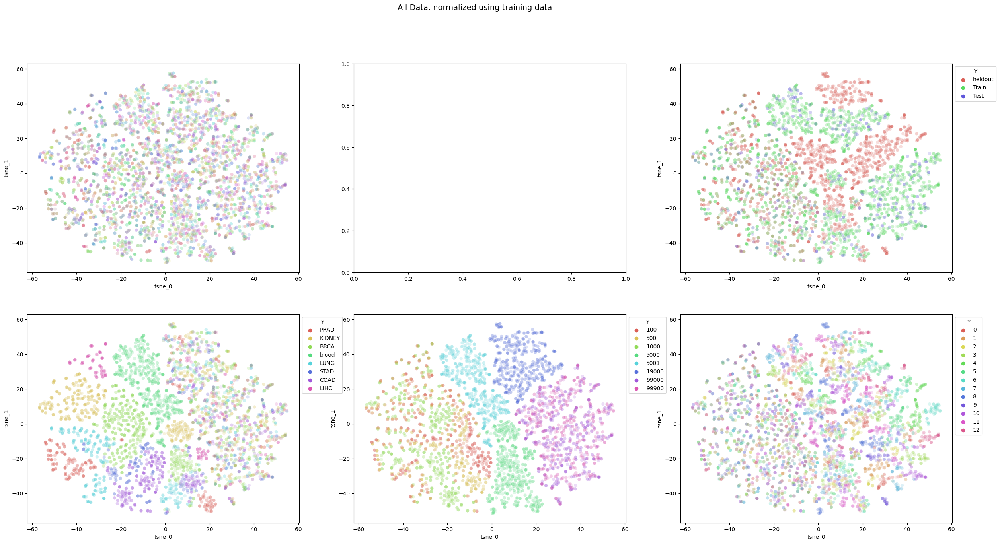

In [40]:
## plot samples
idx_tmp = np.random.choice(range(X_full.shape[0]), 10000, replace=True)


plot_df = vp.get_tsne_for_plotting(X_full[idx_tmp,])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_tmp])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].cancer_type.to_numpy(), axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.iloc[idx_tmp].num_blood.to_numpy(), axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

axs[0,0].legend([],[], frameon=False)

fig.show()


# **Run BuDDI**

## Hyperparameter Search

We are going to search over 2 parameters: 

1.  the weighting of the loss for the latent space classifications against the reconstruction (100, 1000, 10000)
2.  the number of epochs  (50, 100, 200)

In [41]:
y_kp

array([[0.002     , 0.0008    , 0.3       , ..., 0.0062    , 0.0088    ,
        0.0012    ],
       [0.30743434, 0.23920202, 0.02375758, ..., 0.07090909, 0.02078788,
        0.03229293],
       [0.02657658, 0.20436436, 0.11162162, ..., 0.31672673, 0.05680681,
        0.0094995 ],
       ...,
       [0.01718719, 0.25118118, 0.11196196, ..., 0.00224224, 0.05834835,
        0.06159159],
       [0.162     , 0.082     , 0.074     , ..., 0.008     , 0.012     ,
        0.18      ],
       [0.023     , 0.072     , 0.074     , ..., 0.311     , 0.014     ,
        0.169     ]])

2024-04-18 18:11:23.823375: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:375] MLIR V1 optimization pass is not enabled
2024-04-18 18:11:23.834716: W tensorflow/c/c_api.cc:304] Operation '{name:'cls_h1/bias/Assign' id:254 op device:{requested: '', assigned: ''} def:{{{node cls_h1/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](cls_h1/bias, cls_h1/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-04-18 18:11:23.993551: W tensorflow/c/c_api.cc:304] Operation '{name:'z_samp_slack/truediv/y' id:317 op device:{requested: '', assigned: ''} def:{{{node z_samp_slack/truediv/y}} = Const[_has_manual_control_dependencies=true, dtype=DT_FLOAT, value=Tensor<type: float shape: [] values: 2>]()}}' was changed by setting attribute after it

test_size_samp: 500
train_size_samp: 2000


2024-04-18 18:11:24.429732: W tensorflow/c/c_api.cc:304] Operation '{name:'training/Adam/bulk_h2/bias/v/Assign' id:1991 op device:{requested: '', assigned: ''} def:{{{node training/Adam/bulk_h2/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](training/Adam/bulk_h2/bias/v, training/Adam/bulk_h2/bias/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-04-18 18:11:24.943157: W tensorflow/c/c_api.cc:304] Operation '{name:'loss_1/AddN' id:942 op device:{requested: '', assigned: ''} def:{{{node loss_1/AddN}} = AddN[N=3, T=DT_FLOAT, _has_manual_control_dependencies=true](loss_1/mul, loss_1/mul_1, loss_1/mul_2)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2335: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates = self.state_updates
2024-04-18 18:11:25.164511: W tensorflow/c/c_api.cc:304] Operation '{name:'loss/AddN' id:749 op device:{requested: '', assigned: ''} def:{{{node loss/AddN}} = AddN[N=4, T=DT_FLOAT, _has_manual_control_dependenci

Elapsed:  728.8558931350708
Epoch:  499
INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_atac/buddi_atac/tcga_analysis/../results/buddiM2_tcga//all-tcga_known_prop_vae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_atac/buddi_atac/tcga_analysis/../results/buddiM2_tcga//all-tcga_known_prop_vae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_atac/buddi_atac/tcga_analysis/../results/buddiM2_tcga//all-tcga_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_atac/buddi_atac/tcga_analysis/../results/buddiM2_tcga//all-tcga_unknown_prop_vae/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_atac/buddi_atac/tcga_analysis/../results/buddiM2_tcga//all-tcga_encoder_unlab/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_atac/buddi_atac/tcga_analysis/../results/buddiM2_tcga//all-tcga_encoder_unlab/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_atac/buddi_atac/tcga_analysis/../results/buddiM2_tcga//all-tcga_encoder_lab/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_atac/buddi_atac/tcga_analysis/../results/buddiM2_tcga//all-tcga_encoder_lab/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_atac/buddi_atac/tcga_analysis/../results/buddiM2_tcga//all-tcga_decoder/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_atac/buddi_atac/tcga_analysis/../results/buddiM2_tcga//all-tcga_decoder/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_atac/buddi_atac/tcga_analysis/../results/buddiM2_tcga//all-tcga_classifier/assets


INFO:tensorflow:Assets written to: /home/natalie/projects/checkouts/buddi_atac/buddi_atac/tcga_analysis/../results/buddiM2_tcga//all-tcga_classifier/assets


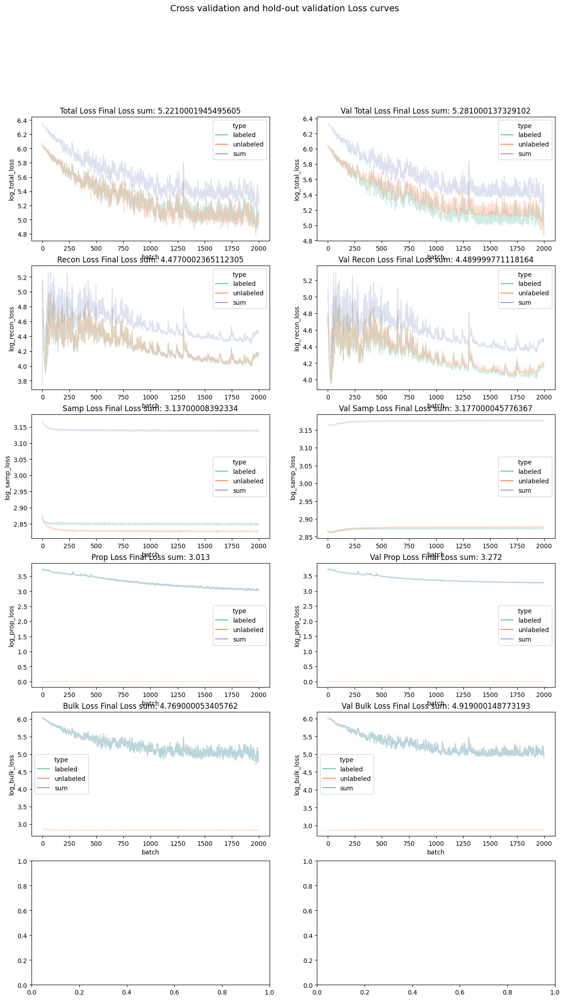

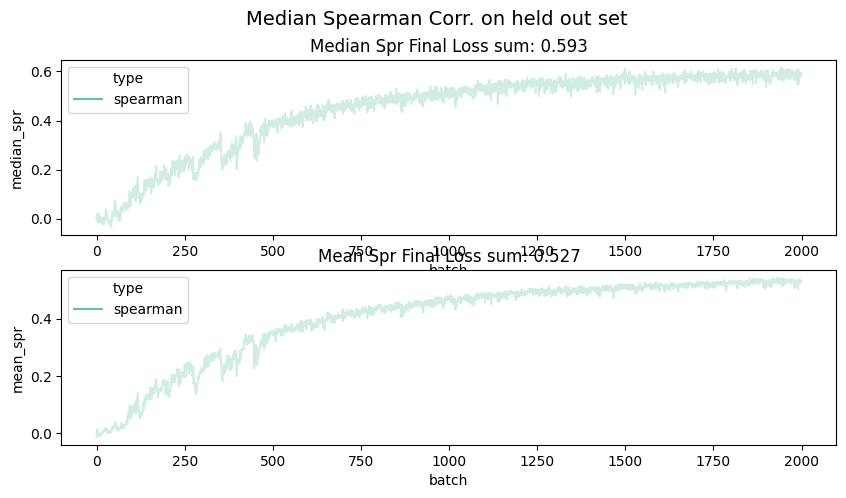

In [25]:
curr_n_epoch=500
curr_wt = 100

params = buddi.BuddiTrainParameters(n_epoch=curr_n_epoch, 
            alpha_rot=curr_wt, alpha_prop=curr_wt, 
            alpha_bulk=curr_wt*100, alpha_drug=0)


curr_res_id = f"{res_id}"
res = buddi.train_buddi(res_data_path, curr_res_id, use_buddi4=False, 
            n_tot_samples=n_tot_samples, n_drugs=0, n_tech=n_drugs, 
            X_unkp=X_unkp, label_unkp=label_unkp, drug_unkp=None, bulk_unkp=drug_unkp,
            X_kp=X_kp, y_kp=y_kp, label_kp=label_kp, drug_kp=None, bulk_kp=drug_kp, params=params)


## visualize latent spaces

### subset data

In [26]:
Y_full

,CD4+ naïve T,CD4+ memory T,CD8+ naïve T,NK,CD14 mono,CD16 mono,intermediate mono,memory B,MAIT,CD8+ activated T,naïve B,pDC,mDC
0,0.160000,0.030000,0.040000,0.010000,0.140000,0.290000,0.020000,0.010000,0.010000,0.190000,0.020000,0.020000,0.060000
0,0.021053,0.004632,0.052474,0.062789,0.026842,0.002579,0.036211,0.043421,0.057421,0.007579,0.061684,0.458158,0.165158
0,0.460000,0.020000,0.010000,0.020000,0.010000,0.020000,0.030000,0.010000,0.050000,0.010000,0.340000,0.010000,0.010000
0,0.055434,0.027394,0.020697,0.236616,0.094677,0.128596,0.016899,0.025121,0.281475,0.074081,0.015606,0.010343,0.013061
0,0.006599,0.008598,0.084983,0.001800,0.284143,0.194161,0.002400,0.128974,0.028794,0.040992,0.053789,0.051590,0.113177
...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0.000150,0.000601,0.005085,0.000891,0.002973,0.095616,0.070891,0.000260,0.002232,0.001231,0.011932,0.802252,0.005886
0,0.070651,0.067578,0.067297,0.137017,0.010611,0.076106,0.046316,0.090861,0.070531,0.084935,0.181952,0.074965,0.021181
0,0.416717,0.027227,0.098028,0.021301,0.006236,0.024174,0.140430,0.082973,0.035375,0.001171,0.029660,0.113423,0.003283
0,0.007758,0.042432,0.149750,0.051962,0.018619,0.035055,0.040480,0.125345,0.041902,0.101912,0.020571,0.315836,0.048378


In [27]:
cancer_df

,BRCA,COAD,KIDNEY,LIHC,LUNG,PRAD,STAD,blood
LUAD_8B7E9FCA_C6CF_45A8_8A9B_646198BB6495_X032_S03_L075_B1_T2_P082,0,0,0,0,1,0,0,0
KIRP_52DFFDB2_62DB_4DD7_91BB_B9C34FC1E08C_X016_S07_L059_B1_T1_P032,0,0,1,0,0,0,0,0
BRCA_78F79CE9_210D_47BF_B6AB_AA5327778FBE_X010_S03_L053_B1_T1_P021,1,0,0,0,0,0,0,0
COAD_29C18FA9_CDF6_49A5_9CEB_49C11EF0433F_X003_S08_L033_B1_T1_P002,0,1,0,0,0,0,0,0
COAD_BA3E7A65_30AB_4ED9_BF52_ED8138164EB9_X007_S08_L070_B1_T2_PMRG,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...
STAD_BAB7D0D7_4F14_4ED4_B8E4_B9E760F57246_X041_S02_L003_B1_T1_P084,0,0,0,0,0,0,1,0
STAD_D1C43A87_4C70_4AE9_9023_880A46E79F21_X037_S09_L065_B1_T1_PMRG,0,0,0,0,0,0,1,0
STAD_D1C43A87_4C70_4AE9_9023_880A46E79F21_X037_S09_L066_B1_T2_P088,0,0,0,0,0,0,1,0
STAD_E07AAE91_7A4F_4FDC_9D67_4FA1D4E6DD89_X024_S05_L012_B1_T2_P069,0,0,0,0,0,0,1,0


In [28]:
meta_df

,sample_id,cancer_type,isTraining,num_blood,samp_type,Y_max
LUAD_8B7E9FCA_C6CF_45A8_8A9B_646198BB6495_X032_S03_L075_B1_T2_P082,LUAD_8B7E9FCA_C6CF_45A8_8A9B_646198BB6495_X032...,LUNG,Train,100,100,LUNG
KIRP_52DFFDB2_62DB_4DD7_91BB_B9C34FC1E08C_X016_S07_L059_B1_T1_P032,KIRP_52DFFDB2_62DB_4DD7_91BB_B9C34FC1E08C_X016...,KIDNEY,Train,19000,19000,KIDNEY
BRCA_78F79CE9_210D_47BF_B6AB_AA5327778FBE_X010_S03_L053_B1_T1_P021,BRCA_78F79CE9_210D_47BF_B6AB_AA5327778FBE_X010...,BRCA,Train,100,100,BRCA
COAD_29C18FA9_CDF6_49A5_9CEB_49C11EF0433F_X003_S08_L033_B1_T1_P002,COAD_29C18FA9_CDF6_49A5_9CEB_49C11EF0433F_X003...,COAD,Train,99000,99000,COAD
COAD_BA3E7A65_30AB_4ED9_BF52_ED8138164EB9_X007_S08_L070_B1_T2_PMRG,COAD_BA3E7A65_30AB_4ED9_BF52_ED8138164EB9_X007...,blood,Train,5001,5001,blood
...,...,...,...,...,...,...
STAD_BAB7D0D7_4F14_4ED4_B8E4_B9E760F57246_X041_S02_L003_B1_T1_P084,STAD_BAB7D0D7_4F14_4ED4_B8E4_B9E760F57246_X041...,STAD,heldout,99900,99900,STAD
STAD_D1C43A87_4C70_4AE9_9023_880A46E79F21_X037_S09_L065_B1_T1_PMRG,STAD_D1C43A87_4C70_4AE9_9023_880A46E79F21_X037...,STAD,heldout,99900,99900,STAD
STAD_D1C43A87_4C70_4AE9_9023_880A46E79F21_X037_S09_L066_B1_T2_P088,STAD_D1C43A87_4C70_4AE9_9023_880A46E79F21_X037...,STAD,heldout,99900,99900,STAD
STAD_E07AAE91_7A4F_4FDC_9D67_4FA1D4E6DD89_X024_S05_L012_B1_T2_P069,STAD_E07AAE91_7A4F_4FDC_9D67_4FA1D4E6DD89_X024...,STAD,heldout,99900,99900,STAD


In [29]:
Bulk_full

array([0, 5, 0, ..., 7, 7, 7])

In [30]:


res1_enc_unlab = tf.keras.models.load_model(f"{res_data_path}/{exp_id}_encoder_unlab")
res1_enc_lab = tf.keras.models.load_model(f"{res_data_path}/{exp_id}_encoder_lab")
res1_dec = tf.keras.models.load_model(f"{res_data_path}/{exp_id}_decoder")
res1_classifier = tf.keras.models.load_model(f"{res_data_path}/{exp_id}_classifier")
res1_unk_prop_vae = res.unknown_prop_vae




2024-04-18 18:23:39.438710: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_20' id:4179 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_20}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_3, Identity_508)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


2024-04-18 18:23:39.802161: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_43' id:4478 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_43}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_14, Identity_531)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-04-18 18:23:39.959085: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_53' id:4619 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_53}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](kernel_19, Identity_541)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will tr

2024-04-18 18:23:40.125998: W tensorflow/c/c_api.cc:304] Operation '{name:'AssignVariableOp_56' id:4702 op device:{requested: '/device:CPU:0', assigned: ''} def:{{{node AssignVariableOp_56}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false, _device="/device:CPU:0"](bias_21, Identity_544)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


### plot data

/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-04-18 18:23:40.380957: W tensorflow/c/c_api.cc:304] Operation '{name:'tf_op_layer_z_samp_slack/add/z_samp_slack/add' id:4256 op device:{requested: '', assigned: ''} def:{{{node tf_op_layer_z_samp_slack/add/z_samp_slack/add}} = AddV2[T=DT_FLOAT, _cloned=true, _has_manual_control_dependencies=true](mu_slack_1/BiasAdd, tf_op_layer_z_samp_slack/mul/z_samp_slack/mul)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2024-04-18 18:23:40.580037: W tensorflow/c/c_api.cc:304] Operation '{name:'cls_out_1/Softmax' id:4723 op d

(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)


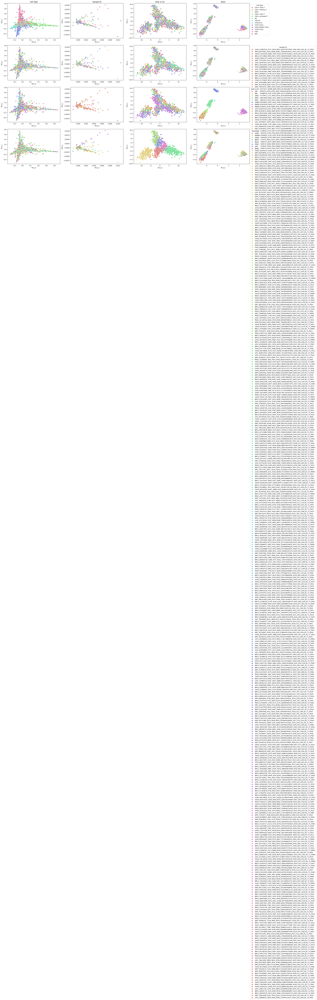

In [31]:
# subset the data to the training data
# to show our latent spaces are learning appropriately

idx_tmp = np.where(meta_df.isTraining == "Train")[0]
idx_tmp = np.random.choice(idx_tmp, 5000, replace=True)


X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]
Y_temp = Y_full.columns[Y_temp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]
label_temp = index_label[label_temp]


drug_temp = np.copy(Drug_full)
drug_temp = drug_temp[idx_tmp]
drug_temp = index_drug[drug_temp]

bulk_temp =np.copy(meta_df.num_blood)
bulk_temp = bulk_temp[idx_tmp]


res1_latent_plot = buddi.plot_latent_spaces(res1_enc_unlab, res1_classifier,
                        X_temp, Y_temp, label_temp, drug_temp, bulk_temp, 
                        batch_size=500, use_buddi4=False, hide_sample_ids=True)

(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)


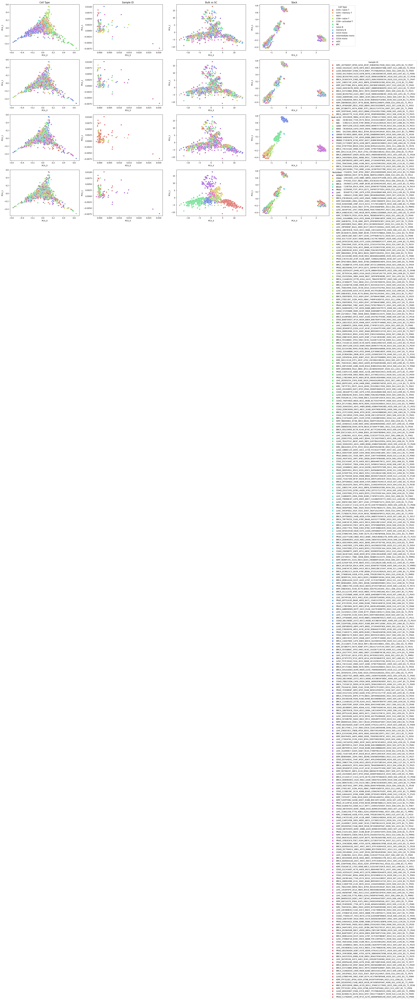

In [32]:
# subset the data to the training data
# to show our latent spaces are learning appropriately

idx_tmp = np.where(meta_df.isTraining == "heldout")[0]
idx_tmp = np.random.choice(idx_tmp, 5000, replace=True)


X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]
Y_temp = Y_full.columns[Y_temp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]
label_temp = index_label[label_temp]


drug_temp = np.copy(Drug_full)
drug_temp = drug_temp[idx_tmp]
drug_temp = index_drug[drug_temp]

bulk_temp =np.copy(meta_df.num_blood)
bulk_temp = bulk_temp[idx_tmp]


res1_latent_plot = buddi.plot_latent_spaces(res1_enc_unlab, res1_classifier,
                        X_temp, Y_temp, label_temp, drug_temp, bulk_temp, 
                        batch_size=500, use_buddi4=False, hide_sample_ids=False)

(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)
(5000, 2)


(5000, 2)
(5000, 2)


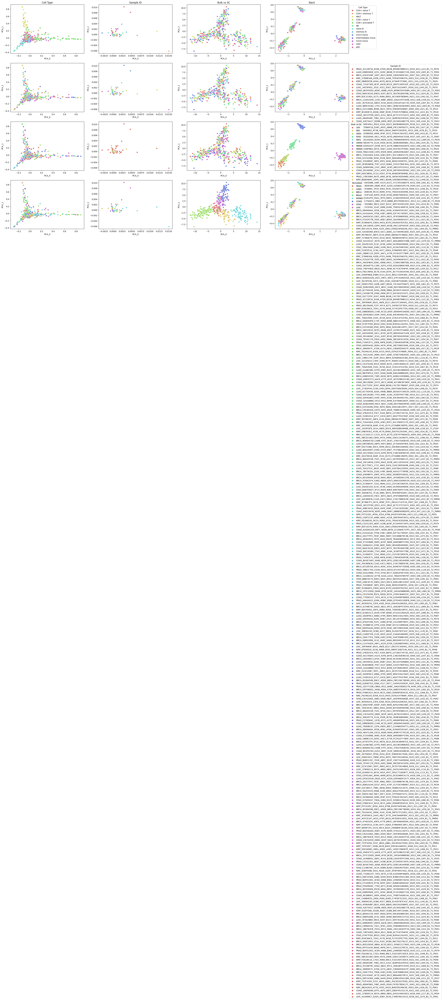

In [33]:
# subset the data to the training data
# to show our latent spaces are learning appropriately

idx_tmp = np.where(meta_df.isTraining == "Test")[0]
idx_tmp = np.random.choice(idx_tmp, 5000, replace=True)


X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]
Y_temp = Y_full.columns[Y_temp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]
label_temp = index_label[label_temp]


drug_temp = np.copy(Drug_full)
drug_temp = drug_temp[idx_tmp]
drug_temp = index_drug[drug_temp]

bulk_temp =np.copy(meta_df.num_blood)
bulk_temp = bulk_temp[idx_tmp]


res1_latent_plot = buddi.plot_latent_spaces(res1_enc_unlab, res1_classifier,
                        X_temp, Y_temp, label_temp, drug_temp, bulk_temp, 
                        batch_size=500, use_buddi4=False, hide_sample_ids=False)

In [34]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import classification_report


/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/keras/src/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2024-04-18 18:24:15.976066: W tensorflow/c/c_api.cc:304] Operation '{name:'decoder_out_2/Sigmoid' id:453 op device:{requested: '', assigned: ''} def:{{{node decoder_out_2/Sigmoid}} = Sigmoid[T=DT_FLOAT, _has_manual_control_dependencies=true](decoder_out_2/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


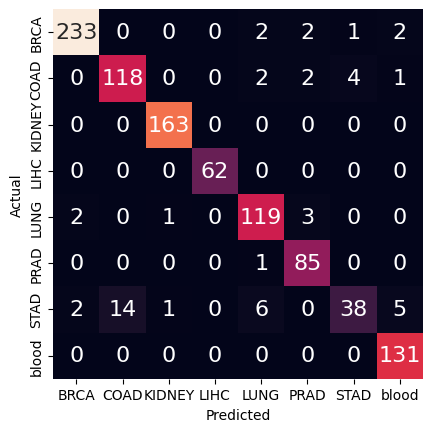

In [35]:
# now plot with ground truth
# cell type proportion labels
idx_tmp = np.where(meta_df.isTraining == "heldout")[0]
idx_tmp = np.random.choice(idx_tmp, 1000, replace=False)

X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]


perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]


_, _, ct_pred = res1_unk_prop_vae.predict(X_temp, batch_size=500)

ct_pred = np.argmax(ct_pred, axis=1)
ct_true = perturb_temp
labels = index_drug[[0, 1, 2, 3, 4, 5, 6, 7]]

cm = confusion_matrix(ct_true, ct_pred)

df_cm = pd.DataFrame(cm, labels, labels)
ax = sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, square=True, cbar=False, fmt='g')
ax.set_ylim(0, 8) #this manually corrects the cutoff issue in sns.heatmap found in matplotlib ver 3.1.1
plt.xlabel("Predicted") 
plt.ylabel("Actual") 
ax.invert_yaxis() #optional
plt.show()

In [36]:
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "heldout", meta_df.num_blood == 99900))[0]
idx_len = len(idx_tmp)

idx_len

200

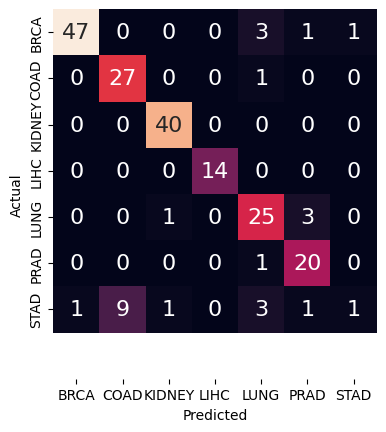

In [38]:
# now plot with ground truth
# cell type proportion labels
idx_tmp = np.where(np.logical_and(meta_df.isTraining == "heldout", meta_df.num_blood == 99900))[0]
idx_len = len(idx_tmp)
idx_tmp = np.append(idx_tmp, idx_tmp)
idx_tmp = np.append(idx_tmp, idx_tmp)[0:500]

X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]


perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]


_, _, ct_pred = res1_unk_prop_vae.predict(X_temp, batch_size=500)

ct_pred = np.argmax(ct_pred, axis=1)[0:idx_len]
ct_true = perturb_temp[0:idx_len]
labels = index_drug[[0, 1, 2, 3, 4, 5, 6]]

cm = confusion_matrix(ct_true, ct_pred)

df_cm = pd.DataFrame(cm, labels, labels)
ax = sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}, square=True, cbar=False, fmt='g')
ax.set_ylim(0, 8) #this manually corrects the cutoff issue in sns.heatmap found in matplotlib ver 3.1.1
plt.xlabel("Predicted") 
plt.ylabel("Actual") 
ax.invert_yaxis() #optional
plt.show()

In [39]:
print(classification_report(ct_true, ct_pred, target_names=labels))

              precision    recall  f1-score   support

        BRCA       0.98      0.90      0.94        52
        COAD       0.75      0.96      0.84        28
      KIDNEY       0.95      1.00      0.98        40
        LIHC       1.00      1.00      1.00        14
        LUNG       0.76      0.86      0.81        29
        PRAD       0.80      0.95      0.87        21
        STAD       0.50      0.06      0.11        16

    accuracy                           0.87       200
   macro avg       0.82      0.82      0.79       200
weighted avg       0.85      0.87      0.84       200



# now classify the cfDNA

In [58]:
# read it in
cfdna_adata = ad.read_h5ad(cfdna_file)

# format into dataframe
cfdna_X = pd.DataFrame(cfdna_adata.X.todense())
cfdna_X.columns = cfdna_adata.var.gene_ids
cfdna_X = cfdna_X[union_genes]

# repeat 500 times for batch size
cfdna_X = np.append(cfdna_X, cfdna_X, axis=0)
idx_tmp = np.random.choice([0,1], 500, replace=True)
X_temp = np.copy(cfdna_X)
X_temp = X_temp[idx_tmp,]


## normalize within sample
X_temp = np.clip(X_temp, 0, clip_upper)

# now normalize with the scaler trained on the 
# training data
X_temp = scaler.transform(X_temp)




(500, 7000)

In [59]:
# now predict

_, _, ct_pred = res1_unk_prop_vae.predict(X_temp, batch_size=500)

ct_pred = np.argmax(ct_pred, axis=1)[0:idx_len]
ct_pred

/home/natalie/projects/checkouts/buddi_atac/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


array([[1.5843607 , 2.1080103 , 0.14216344, ..., 0.13831824, 0.1723364 ,
        0.75273246],
       [1.5843607 , 2.1080103 , 0.14216344, ..., 0.13831824, 0.1723364 ,
        0.75273246],
       [1.5843607 , 2.1080103 , 0.14216344, ..., 0.13831824, 0.1723364 ,
        0.75273246],
       ...,
       [1.5843607 , 2.1080103 , 0.14216344, ..., 0.13831824, 0.1723364 ,
        0.75273246],
       [1.5843607 , 2.1080103 , 0.14216344, ..., 0.13831824, 0.1723364 ,
        0.75273246],
       [1.5843607 , 2.1080103 , 0.14216344, ..., 0.13831824, 0.1723364 ,
        0.75273246]], dtype=float32)